## Dan Wigodsky  
##Data 608  


# Data Visualization with Python  

##Using Plotly and Datashader

##Question 1

"After a few building collapses, the City of New York is going to begin investigating older buildings for safety. The city is particularly worried about buildings that were unusually tall when they were built, since best-practices for safety hadn’t yet been determined. Create a graph that shows how many buildings of a certain number of floors were built in each year (note: you may want to use a log scale for the number of buildings). Find a strategy to bin buildings (It should be clear 20-29-story buildings, 30-39-story buildings, and 40-49-story buildings were first built in large numbers, but does it make sense to continue in this way as you get taller?)"

In [807]:
import datashader as ds
import datashader.transfer_functions as tf
import datashader.glyphs
from datashader import reductions
from datashader.core import bypixel
from datashader.utils import lnglat_to_meters as webm, export_image
from datashader.colors import colormap_select, Greys9, viridis, inferno
import copy


from pyproj import Proj, transform
import numpy as np
import pandas as pd
import urllib
import json
import datetime
import colorlover as cl

import plotly.plotly as py
import plotly.graph_objs as go
from plotly import tools

from shapely.geometry import Point, Polygon, shape
# In order to get shapley, you'll need to run [pip install shapely.geometry] from your terminal

from functools import partial

from IPython.display import GeoJSON

In [808]:
bk = pd.read_csv('Desktop/Data608/PLUTO17v1.1/BK2017V11.csv')
bx = pd.read_csv('Desktop/Data608/PLUTO17v1.1/BX2017V11.csv')
mn = pd.read_csv('Desktop/Data608/PLUTO17v1.1/MN2017V11.csv')
qn = pd.read_csv('Desktop/Data608/PLUTO17v1.1/QN2017V11.csv')
si = pd.read_csv('Desktop/Data608/PLUTO17v1.1/SI2017V11.csv')

ny = pd.concat([bk, bx, mn, qn, si], ignore_index=True)

# Getting rid of some outliers
ny = ny[(ny['YearBuilt'] > 1850) & (ny['YearBuilt'] < 2020) & (ny['NumFloors'] != 0)]

C:\Users\dawig\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning:

Columns (19,20,22,23,24,25,26,64,65,80) have mixed types. Specify dtype option on import or set low_memory=False.

C:\Users\dawig\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning:

Columns (19,20,22,23,64,65,80) have mixed types. Specify dtype option on import or set low_memory=False.

C:\Users\dawig\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning:

Columns (19,20,22,24,26) have mixed types. Specify dtype option on import or set low_memory=False.

C:\Users\dawig\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning:

Columns (19,20,22,23,64,65,77) have mixed types. Specify dtype option on import or set low_memory=False.

C:\Users\dawig\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning:

Columns (19,20,22,24,64,65,80) have mixed types. Specify dtype option on import or set l

In [809]:

wgs84 = Proj("+proj=longlat +ellps=GRS80 +datum=NAD83 +no_defs")
nyli = Proj("+proj=lcc +lat_1=40.66666666666666 +lat_2=41.03333333333333 +lat_0=40.16666666666666 +lon_0=-74 +x_0=300000 +y_0=0 +ellps=GRS80 +datum=NAD83 +to_meter=0.3048006096012192 +no_defs")
ny['XCoord'] = 0.3048*ny['XCoord']
ny['YCoord'] = 0.3048*ny['YCoord']
ny['lon'], ny['lat'] = transform(nyli, wgs84, ny['XCoord'].values, ny['YCoord'].values)

ny = ny[(ny['lon'] < -60) & (ny['lon'] > -100) & (ny['lat'] < 60) & (ny['lat'] > 20)]

#Defining some helper functions for DataShader
background = "black"
export = partial(export_image, background = background, export_path="export")
cm = partial(colormap_select, reverse=(background!="black"))

In [810]:
trace = go.Scatter(
    # I'm choosing BBL here because I know it's a unique key.
    x = ny.groupby('YearBuilt').count()['BBL'].index,
    y = ny.groupby('YearBuilt').count()['BBL'],
    marker = dict(
          color = 'darksalmon')
)

layout = go.Layout(
    xaxis = dict(title = 'Year Built'),
    yaxis = dict(title = 'Number of Lots Built')
)

fig = go.Figure(data = [trace], layout = layout)

py.iplot(fig, filename = 'ny-year-built')

High five! You successfully sent some data to your account on plotly. View your plot in your browser at https://plot.ly/~DanWig/0 or inside your plot.ly account where it is named 'ny-year-built'


In [811]:
import math
FloorBins = [0]
for i in range(16,1,-1):
    FloorBins.append(141-(18.7*math.log(i*110)))
FloorBins.append(110)
labeler=['1 floor or less']
for i in range(2,17):
    labelText=math.floor(FloorBins[i])
    labeler.append(str(labelText)+' floors or less')
ny['BuildingHeight']=pd.cut(ny['NumFloors'],bins=FloorBins,labels=labeler)

When we arrange our data by a log based scale, we see that the vast majority of buildings are small 1, 2 and 3 floor buildings.  Our interest is in buildings that were built tall in their era.  We want to ignore the small buildings that are not of interest.

In [812]:
ny_height_year=ny[['BuildingHeight', 'NumFloors', 'YearBuilt']]
ny_height_num = ny_height_year.groupby('BuildingHeight').count().reset_index()
#ny_height_year[290:300]
ny_height_num.drop_duplicates
data2=[go.Bar(
      x=ny_height_num['BuildingHeight'],
      y=ny_height_num['NumFloors'])]
layout2 = go.Layout(
    xaxis = dict(title = 'Height by Floor'),
    yaxis = dict(title = 'Number of Buildings')

)
fig=go.Figure(data=data2,layout=layout2)
py.iplot(fig,filename='Building-Counts-By-Size')

In [813]:
YearBins=[0]
for i in range (1895,2025,5):
    YearBins.append(i)
#print(YearBins)
EraLabels=[1895, 1900, 1905, 1910, 1915, 1920, 1925, 1930, 1935, 1940, 1945, 1950, 1955, 1960, 1965, 1970, 1975, 1980, 1985, 1990, 1995, 2000, 2005, 2010, 2015, 2020]
ny_height_year['Era']=pd.cut(ny_height_year['YearBuilt'],bins=YearBins,labels=EraLabels)
ny_decade_num = ny_height_year.groupby('Era').count().reset_index()


C:\Users\dawig\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



When we bin our years in groups of 5, we get a better sense of the data than in our original graph.  We've eliminated the unnecessary spikes that were really artificail in our data.

In [814]:
data3=[go.Bar(
      x=ny_decade_num['Era'],
      y=ny_decade_num['NumFloors'],
      marker = dict(
          color = 'ivory')

)]
layout3 = go.Layout(
    xaxis = dict(title = 'Half Decade'),
    yaxis = dict(title = 'Number of Buildings'),
    plot_bgcolor='darksalmon'
)
fig=go.Figure(data=data3,layout=layout3)
py.iplot(fig,filename='Building-Counts-By-Half-Decade')

In [815]:
TallBuildingSet=ny_height_num[5:]
data2=[go.Bar(
      x=TallBuildingSet['BuildingHeight'],
      y=TallBuildingSet['NumFloors'])]
layout2 = go.Layout(
    xaxis = dict(title = 'Height by Floor'),
    yaxis = dict(title = 'Number of Buildings')

)
#This graph would produce a bar graph of buildings with the smaller ones eliminated.
#fig=go.Figure(data=data2,layout=layout2)
#py.iplot(fig,filename='Large-Building-Counts-By-Size')

In [816]:
#ny_height_year[1:10]
ny_height_year=ny_height_year[(ny_height_year['NumFloors'] > 6.5)] 
#ny_height_year.sort_values(by=['NumFloors'])

In [817]:
ny_height_year.sort_values(by=['NumFloors'])
ny_limited_bins=ny_height_year.replace('10 floors or less','12 floors or less')
ny_limited_bins=ny_limited_bins.replace('14 floors or less','16 floors or less')
ny_limited_bins=ny_limited_bins.replace('19 floors or less','23 floors or less')
ny_limited_bins=ny_limited_bins.replace('27 floors or less','24 floors or more')
ny_limited_bins=ny_limited_bins.replace('32 floors or less','24 floors or more')
ny_limited_bins=ny_limited_bins.replace('40 floors or less','24 floors or more')
ny_limited_bins=ny_limited_bins.replace('110 floors or less','24 floors or more')
#ny_limited_bins[260:280]

In [818]:
ny_limited_bins=ny_limited_bins
group_data = ny_limited_bins.groupby('Era')['BuildingHeight'].value_counts().to_frame(name='CategoryCount').reset_index() #sum function

In [819]:
groupA=group_data[(group_data['BuildingHeight'] == '8 floors or less')]
groupB=group_data[(group_data['BuildingHeight'] == '12 floors or less')]
groupC=group_data[(group_data['BuildingHeight'] == '16 floors or less')]
groupD=group_data[(group_data['BuildingHeight'] == '23 floors or less')]
groupE=group_data[(group_data['BuildingHeight'] == '24 floors or more')]

We are interested in which tall buildings were built in which year.  Even though our data came in a yearly form, it wasn't appropriately looked at as yearly data.  Huge spikes were seen every 5 years.  This could be an administrative or legal quirk in the data.  We looked at data only for buildings that are 7 floors or more.  That allowed us to concentrate on taller buildings.  Our height categories were logarithmic, designed to capture all building heights, but to separate out 1, 2 and 3 story buildings, which made up the vast majority of the data.  Our resulting graph gives us a sense of how many buildings were built in different eras that were tall for the time they were being built.

In [820]:
#helper example from above ---ny_height_year[(ny_height_year['NumFloors'] > 6.5)] 
#df.loc[df['column_name'] == some_value]
trace1=go.Bar(
      x=groupA['Era'],
      y=groupA['CategoryCount'],
      name='8 floors or less'
)
trace2=go.Bar(
      x=groupB['Era'],
      y=groupB['CategoryCount'],
      name='12 floors or less'
)
trace3=go.Bar(
      x=groupA['Era'],
      y=groupA['CategoryCount'],
      name='16 floors or less'
)
trace4=go.Bar(
      x=groupB['Era'],
      y=groupB['CategoryCount'],
      name='23 floors or less'
)
trace5=go.Bar(
      x=groupA['Era'],
      y=groupA['CategoryCount'],
      name='24 floors or more'
)

"""trace2=[go.Bar(
      x=group_data['BuildingHeight'],
      y=group_data['NumFloors'])]
trace3=[go.Bar(
      x=group_data['BuildingHeight'],
      y=group_data['NumFloors'])]
trace4=[go.Bar(
      x=group_data['BuildingHeight'],
      y=group_data['NumFloors'])]
trace5=[go.Bar(
      x=group_data['BuildingHeight'],
      y=group_data['NumFloors'])]"""
layout5 = go.Layout(
    title='Number of Buildings 7 Stories or Taller',
    xaxis = dict(title = 'Half Decade Built'),
    legend=dict(x=.6, y=.6),
    yaxis = dict(title = 'Number of Buildings'),
    barmode='stack'
)
data=[trace1,trace2,trace3,trace4,trace5]
fig=go.Figure(data=data,layout=layout5)
py.iplot(fig,filename='NY-Stacked-Bars')

##Question 2

"You work for a real estate developer and are researching underbuilt areas of the city. After looking in the Pluto data dictionary, you've discovered that all tax assessments consist of two parts: The assessment of the land and assessment of the structure. You reason that there should be a correlation between these two values: more valuable land will have more valuable structures on them (more valuable in this case refers not just to a mansion vs a bungalow, but an apartment tower vs a single family home). Deviations from the norm could represent underbuilt or overbuilt areas of the city. You also recently read a really cool blog post about bivariate choropleth maps, and think the technique could be used for this problem."

From the professor: "Datashader is a library from Anaconda that does away with the need for binning data. It takes in all of your datapoints, and based on the canvas and range returns a pixel-by-pixel calculations to come up with the best representation of the data. In short, this completely eliminates the need for binning your data.
As an example, lets continue with our question above and look at a 2D histogram of YearBuilt vs NumFloors:"

In [821]:
yearbins = 200
floorbins = 200

yearBuiltCut = pd.cut(ny['YearBuilt'], np.linspace(ny['YearBuilt'].min(), ny['YearBuilt'].max(), yearbins))
numFloorsCut = pd.cut(ny['NumFloors'], np.logspace(1, np.log(ny['NumFloors'].max()), floorbins))

xlabels = np.floor(np.linspace(ny['YearBuilt'].min(), ny['YearBuilt'].max(), yearbins))
ylabels = np.floor(np.logspace(1, np.log(ny['NumFloors'].max()), floorbins))

data = [
    go.Heatmap(z = ny.groupby([numFloorsCut, yearBuiltCut])['BBL'].count().unstack().fillna(0).values,
              colorscale = 'Greens', x = xlabels, y = ylabels)
]

py.iplot(data, filename = 'datashader-2d-hist')

From the professor: "This shows us the distribution, but it's subject to some biases discussed in the Anaconda notebook Plotting Perils.
Here is what the same plot would look like in datashader:"

C:\Users\dawig\Anaconda3\lib\site-packages\datashader\transfer_functions.py:162: RuntimeWarning:

invalid value encountered in log1p



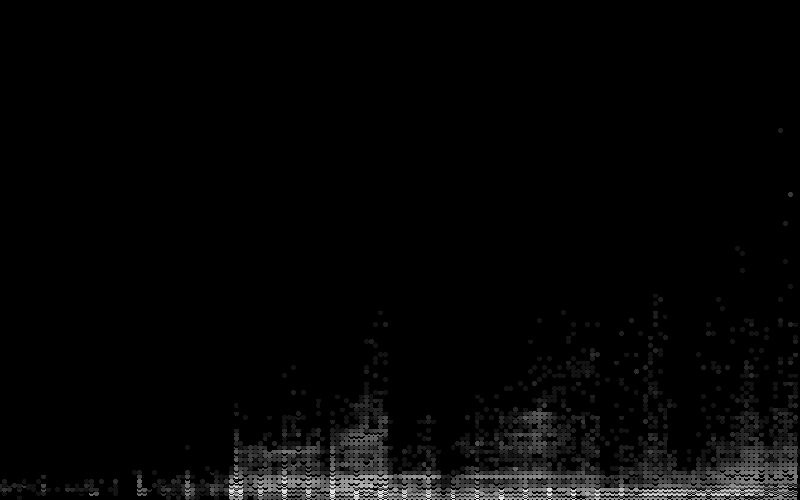

In [822]:
cvs = ds.Canvas(800, 500, x_range = (ny['YearBuilt'].min(), ny['YearBuilt'].max()), 
                                y_range = (ny['NumFloors'].min(), ny['NumFloors'].max()))
agg = cvs.points(ny, 'YearBuilt', 'NumFloors')
view = tf.shade(agg, cmap = cm(Greys9), how='log')
export(tf.spread(view, px=2), 'yearvsnumfloors')

From the professor: "That's technically just a scatterplot, but the points are smartly placed and colored to mimic what one gets in a heatmap. Based on the pixel size, it will either display individual points, or will color the points of denser regions.
Datashader really shines when looking at geographic information. Here are the latitudes and longitudes of our dataset plotted out, giving us a map of the city colored by density of structures:"

In [823]:
NewYorkCity   = (( -74.29,  -73.69), (40.49, 40.92))
cvs = ds.Canvas(700, 700, *NewYorkCity)
agg = cvs.points(ny, 'lon', 'lat')
view = tf.shade(agg, cmap = cm(inferno), how='log')
export(tf.spread(view, px=2), 'firery')
agg[200:220]

C:\Users\dawig\Anaconda3\lib\site-packages\datashader\transfer_functions.py:162: RuntimeWarning:

invalid value encountered in log1p



<xarray.DataArray (lat: 20, lon: 700)>
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])
Coordinates:
  * lat      (lat) float64 40.61 40.61 40.61 40.62 40.62 40.62 40.62 40.62 ...
  * lon      (lon) float64 -74.29 -74.29 -74.29 -74.29 -74.29 -74.29 -74.28 ...

C:\Users\dawig\Anaconda3\lib\site-packages\datashader\transfer_functions.py:162: RuntimeWarning:

invalid value encountered in log1p



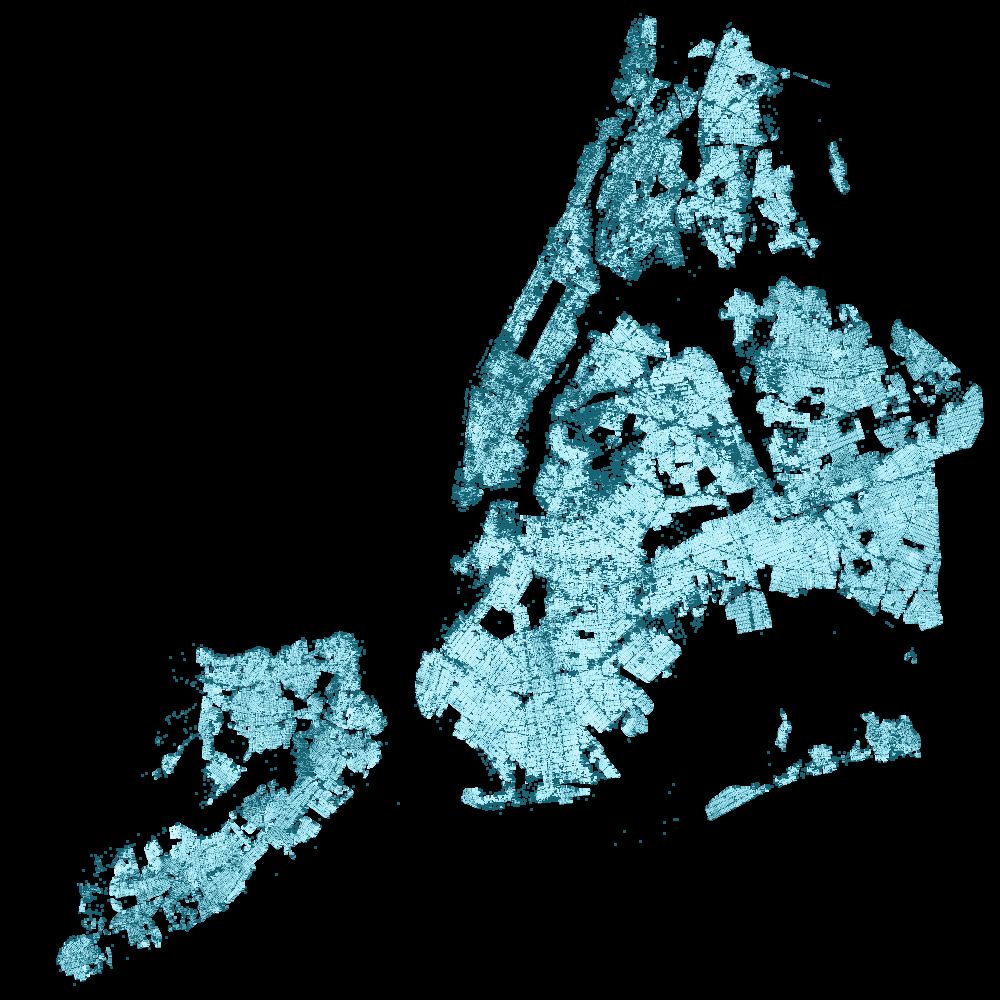

In [824]:

NewYorkCity   = (( -74.29,  -73.69), (40.49, 40.92))
cvs = ds.Canvas(1000, 1000, *NewYorkCity)
agg = cvs.points(ny, 'lon', 'lat')
view = tf.shade(agg, cmap = ['#176475','#a7eaf9','white'], how='log')
export(tf.spread(view, px=1), 'firery')

Because our question is basically a ratio problem, we create a variable that shows the ratio of land value to total assessment value. 

In [825]:
nyOverUnderBuilt = ny
#By printing out some of the individual buildings, we were able to find some buildings to investigate 
#visually on Google maps to see what the data looked like at the level of individual detail
nyOverUnderBuilt['BuiltRatio']=nyOverUnderBuilt['AssessLand']/nyOverUnderBuilt['AssessTot']
nyOverUnderBuilt['BuiltTranche'] = pd.cut(nyOverUnderBuilt['BuiltRatio'],10, labels = range(1,11))
#nyOverUnderBuilt[100:120]

We want to get a sense of some of the buildings and what an overvalued or undervalued building looks like.

This 6 story building is at 136-50 Maple in Flushing, Queens. 
Its ratio is low, meaning it is built to a high value compared to the land value


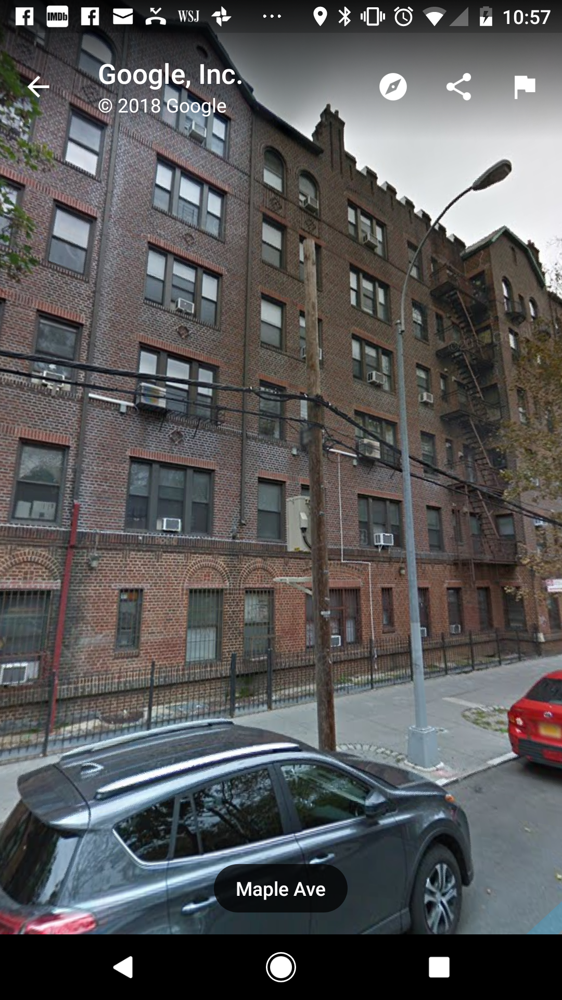

101 Castleton in Staten Island has a ratio of 1.  It is just land.  A car lot in Bushwick has a ratio of .909.


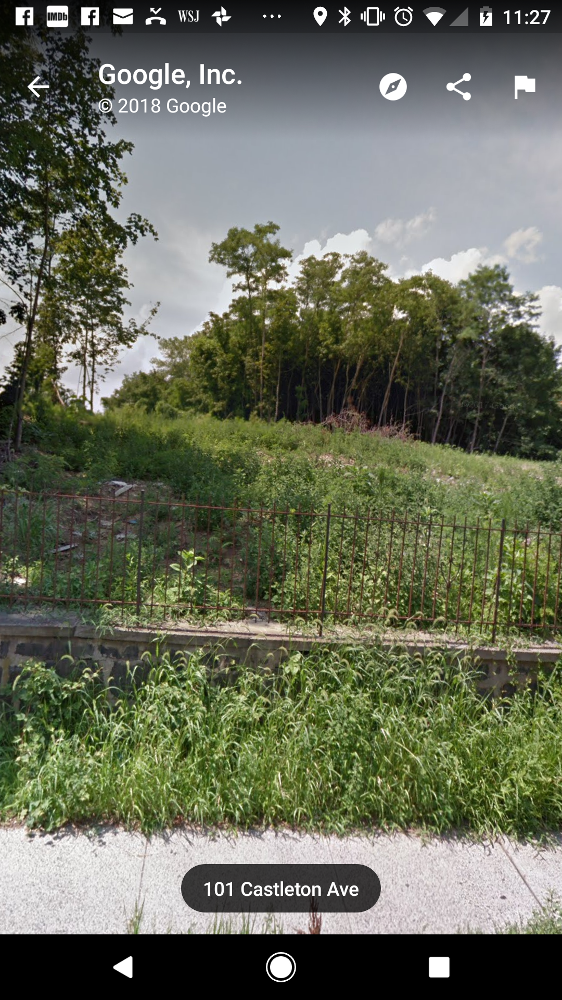

From a sampling, many of the buildings with a ratio of 1 are recently built.  Some of the most underbuilt lots are taken.


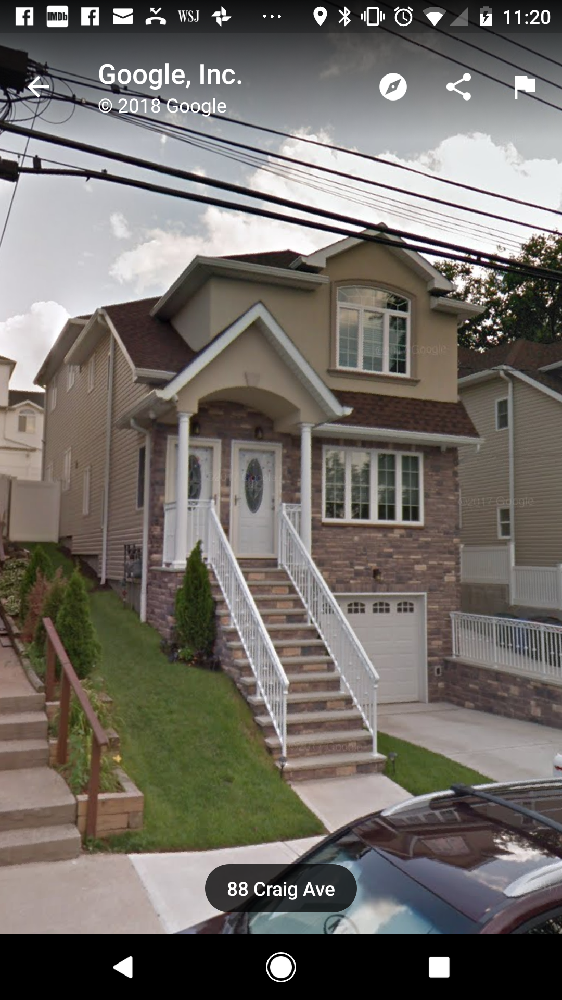

688 Sackett is in Park Slope.  It is in a valuable part of the city.  It has a ratio of .0096, which is quite low.


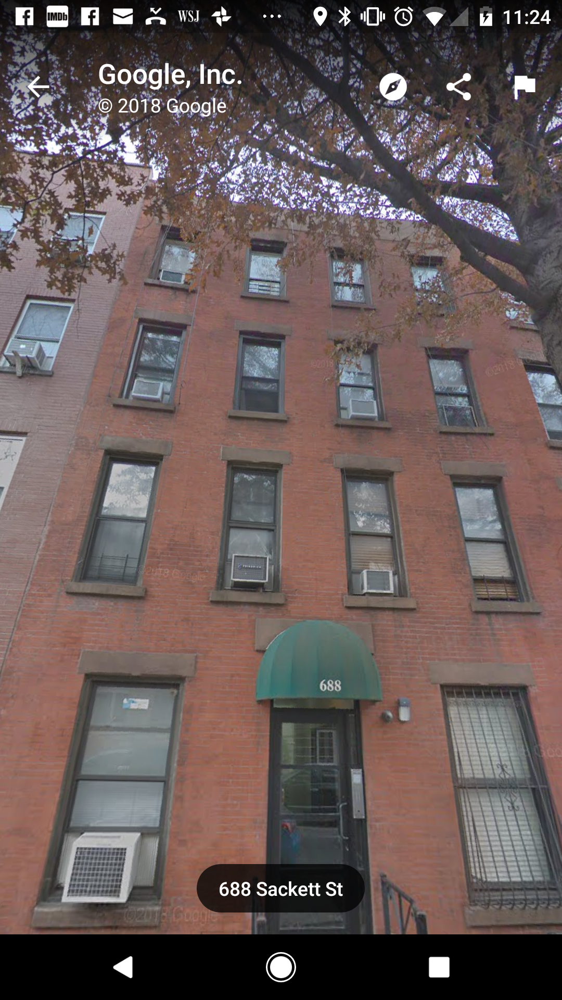

10 Barclay St. is advertised as'The impressive 58-story Barclay Tower
is the most luxurious apartment building in Tribeca - if not the entire city.'  Its ratio is .043.


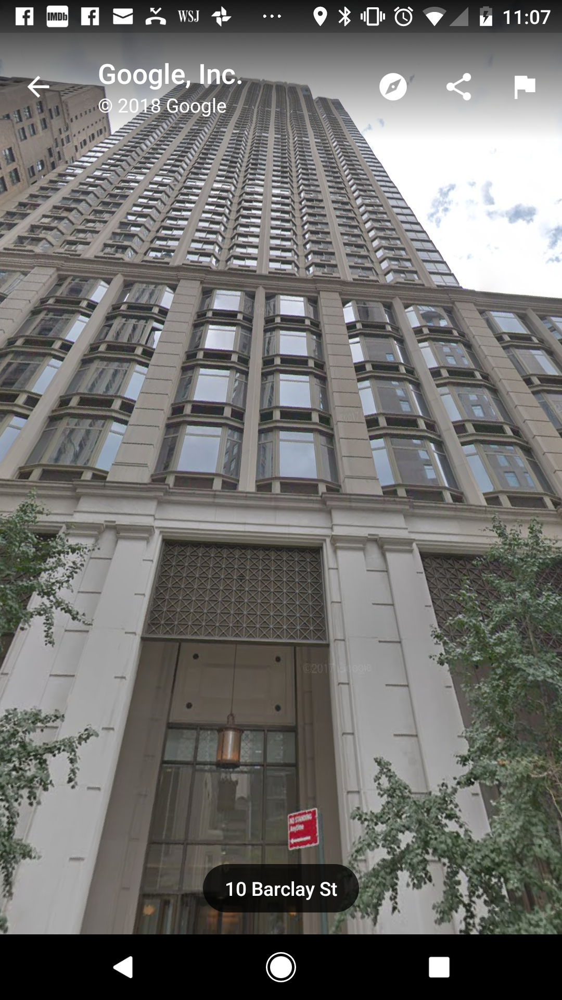

In [826]:
from IPython.display import Image
print("This 6 story building is at 136-50 Maple in Flushing, Queens. ") 
print("Its ratio is low, meaning it is built to a high value compared to the land value")
display(Image("https://raw.githubusercontent.com/WigodskyD/data-sets/master/13650Maple.png",width=200,height=200))
print("101 Castleton in Staten Island has a ratio of 1.  It is just land.  A car lot in Bushwick has a ratio of .909.")
display(Image("https://raw.githubusercontent.com/WigodskyD/data-sets/master/101CastletonAve.png",width=200,height=200))
print("From a sampling, many of the buildings with a ratio of 1 are recently built.  Some of the most underbuilt lots are taken.")
display(Image("https://raw.githubusercontent.com/WigodskyD/data-sets/master/88craig.png",width=200,height=200))
print("688 Sackett is in Park Slope.  It is in a valuable part of the city.  It has a ratio of .0096, which is quite low.")
display(Image("https://raw.githubusercontent.com/WigodskyD/data-sets/master/688Sackett.png",width=200,height=200))
print("10 Barclay St. is advertised as'The impressive 58-story Barclay Tower")
print("is the most luxurious apartment building in Tribeca - if not the entire city.'  Its ratio is .043.")
display(Image("https://raw.githubusercontent.com/WigodskyD/data-sets/master/10BarclaySt.png",width=200,height=200))



A bivariate chloropleth has a disadvantage of displaying information we aren't interested in.  With a complicated map based visualization, we want our underbuilt areas to stand out.  To best incorporate both variables, we created a variable that would show the ratio of land to total value.  The areas in white are the areas where plots are underbuilt.  They stretch across the city at a slight angle from the North of Staten Island across central Brooklyn and some of southern Queens.  In the Bronx, there are a lot of blue areas.  These suggest that some of the land in the Bronx might be undervalued.  Reltively higher value buildings can be built on relatively cheap land.  For a developer of smaller buildings, this might present a nice opportunity. 

C:\Users\dawig\Anaconda3\lib\site-packages\datashader\transfer_functions.py:162: RuntimeWarning:

invalid value encountered in log1p



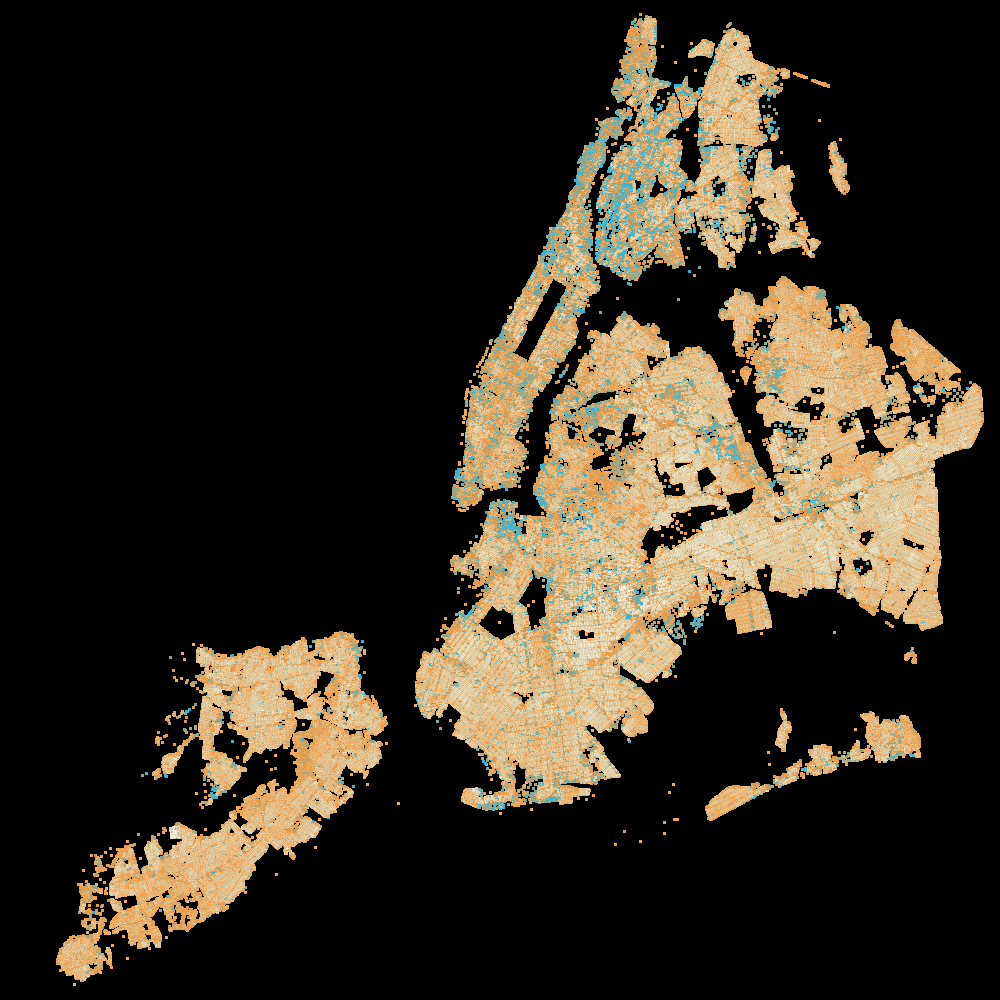

In [827]:
nyOverUnderBuilt['BuiltTranche']=pd.to_numeric(nyOverUnderBuilt['BuiltTranche'])
NewYorkCity   = (( -74.29,  -73.69), (40.49, 40.92))
cvs2 = ds.Canvas(1000, 1000, *NewYorkCity)
agg2 = cvs2.points(nyOverUnderBuilt, 'lon', 'lat',ds.reductions.sum('BuiltTranche'))
view22 = tf.shade(agg2, cmap = ['#39b4d3','#f49b42','#ddcfa8','white'], how='log')
export(tf.spread(view22, px=1), 'OverUnderBuilt')


For another look at real estate opportunities, we look at areas that could be worth more if laws were to change. Buildings represented in this graph are under 4 stories. They also have a low land to building ratio. These plots are built about as dense as they could be today, but with future housing needs in a growing city, may support more in the future.


C:\Users\dawig\Anaconda3\lib\site-packages\datashader\transfer_functions.py:162: RuntimeWarning:

invalid value encountered in log1p



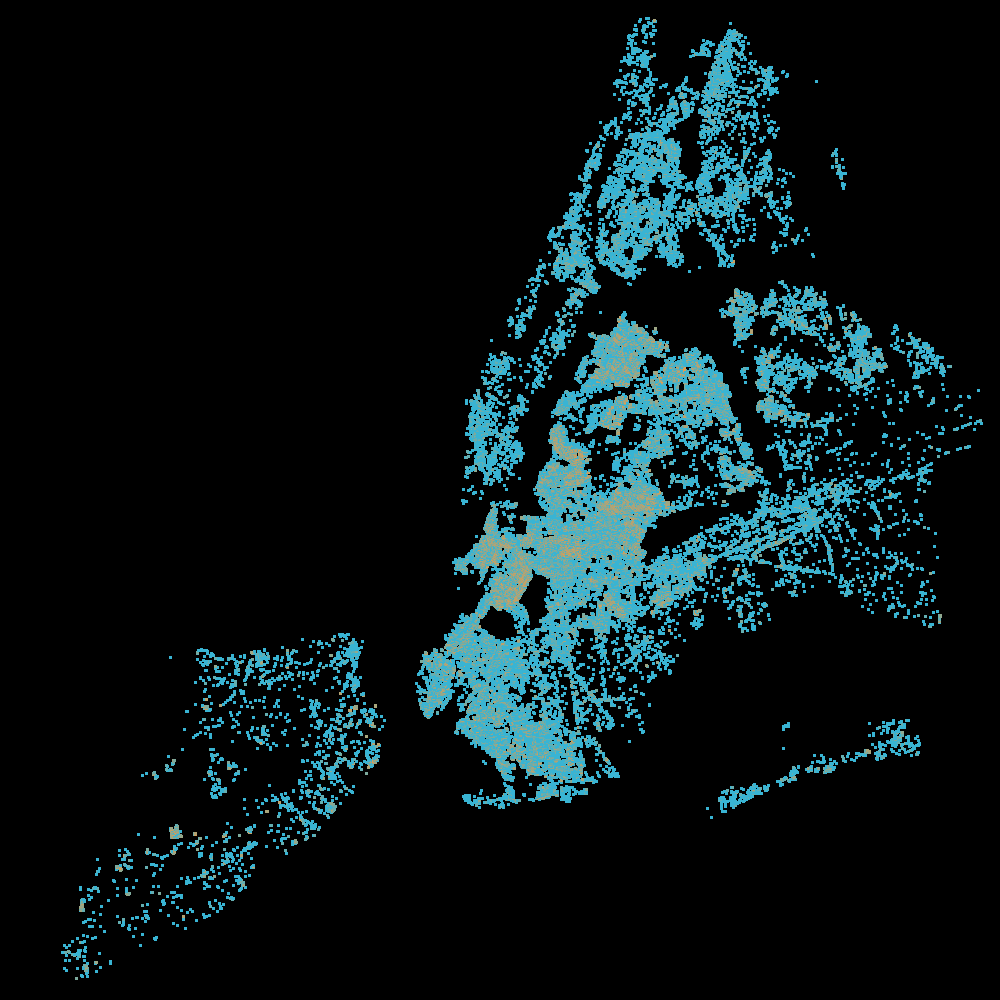

In [828]:
ZoningOpportunity=nyOverUnderBuilt[(nyOverUnderBuilt['NumFloors'] < 5)]
ZoningOpportunity=ZoningOpportunity[(ZoningOpportunity['BuiltRatio'] <.2)] 
NewYorkCity   = (( -74.29,  -73.69), (40.49, 40.92))
cvs3 = ds.Canvas(1000, 1000, *NewYorkCity)
agg3 = cvs3.points(ZoningOpportunity, 'lon', 'lat')
view3 = tf.shade(agg3, cmap = ['#39b4d3','#f49b42'], how='log')
export(tf.spread(view3, px=1), 'ZoningOpportunity')